In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mplt
import seaborn as sns
import arviz as az
import datetime

In [2]:
import fit_arima

In [3]:
import open_data
df_temp = open_data.open()
df = df_temp[0]

In [4]:
ritorno = fit_arima.compute(2, 1, catene=4, samples_per_chain=2500, burnin=1000)

19:19:05 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

chain 3 |          | 00:00 Status

chain 4 |          | 00:00 Status

19:49:59 - cmdstanpy - INFO - CmdStan done processing.
19:49:59 - cmdstanpy - WARNING - Non-fatal error during sampling:
Exception: code_model_namespace::log_prob: H is not symmetric. H[1,2] = inf, but H[2,1] = inf (in '/home/br1/PythonProjects/PythonStats/ARIMA_last_computation/Spatial/code.stan', line 91, column 2 to column 53)
	Exception: code_model_namespace::log_prob: H is not symmetric. H[1,2] = inf, but H[2,1] = inf (in '/home/br1/PythonProjects/PythonStats/ARIMA_last_computation/Spatial/code.stan', line 91, column 2 to column 53)
	Exception: code_model_namespace::log_prob: H is not symmetric. H[1,2] = inf, but H[2,1] = inf (in '/home/br1/PythonProjects/PythonStats/ARIMA_last_computation/Spatial/code.stan', line 91, column 2 to column 53)
	Exception: code_model_namespace::log_prob: H is not symmetric. H[1,2] = inf, but H[2,1] = inf (in '/home/br1/PythonProjects/PythonStats/ARIMA_last_computation/Spatial/code.stan', line 91, column 2 to column 53)
	Exception: code_model_namespace

/home/br1/PythonProjects/PythonStats/ARIMA_last_computation/Spatial/fit_arima.py:43: FutureWarning: Indexing with a float is deprecated, and will raise an IndexError in pandas 2.0. You can manually convert to an integer key instead.
  y_missing_list.append({'Stazione':df.columns[v[i]],'Data':df.index[u[i]],'Samples':inference_data.posterior.w.values[:,:,i].reshape(catene*samples_per_chain)})


Tempo di computazione: 30:53

In [5]:
res = az.loo(ritorno['inference_data'], var_name="log_lik", pointwise=True, scale='deviance')
res

/home/br1/PythonProjects/PythonStats/.venv/lib/python3.10/site-packages/arviz/stats/stats.py:803: UserWarning: Estimated shape parameter of Pareto distribution is greater than 0.7 for one or more samples. You should consider using a more robust model, this is because importance sampling is less likely to work well if the marginal posterior and LOO posterior are very different. This is more likely to happen with a non-robust model and highly influential observations.
  warnings.warn(


Computed from 10000 posterior samples and 17191 observations log-likelihood matrix.

             Estimate       SE
deviance_loo -14505.76   309.72
p_loo          286.07        -

There has been a warning during the calculation. Please check the results.
------

Pareto k diagnostic values:
                         Count   Pct.
(-Inf, 0.5]   (good)     17102   99.5%
 (0.5, 0.7]   (ok)          79    0.5%
   (0.7, 1]   (bad)          8    0.0%
   (1, Inf)   (very bad)     2    0.0%

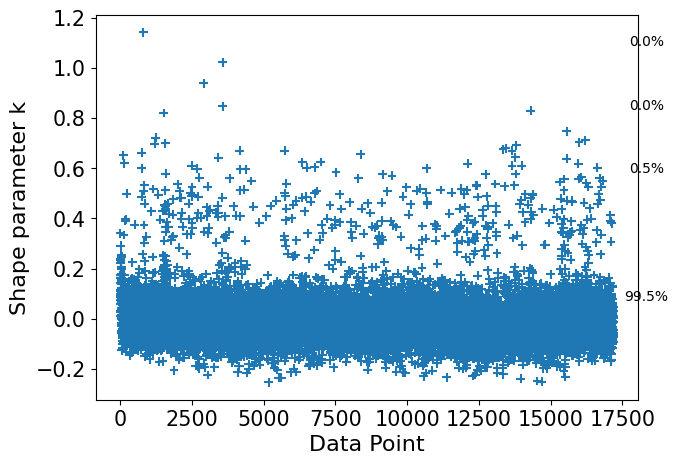

In [6]:
aux_plt = az.plot_khat(res, show_bins=True, figsize=(7,5))

In [7]:
res = az.waic(ritorno['inference_data'], var_name="log_lik", scale='deviance')
res

/home/br1/PythonProjects/PythonStats/.venv/lib/python3.10/site-packages/arviz/stats/stats.py:1645: UserWarning: For one or more samples the posterior variance of the log predictive densities exceeds 0.4. This could be indication of WAIC starting to fail. 
See http://arxiv.org/abs/1507.04544 for details
  warnings.warn(


Computed from 10000 posterior samples and 17191 observations log-likelihood matrix.

              Estimate       SE
deviance_waic -14530.08   309.40
p_waic          273.91        -

There has been a warning during the calculation. Please check the results.

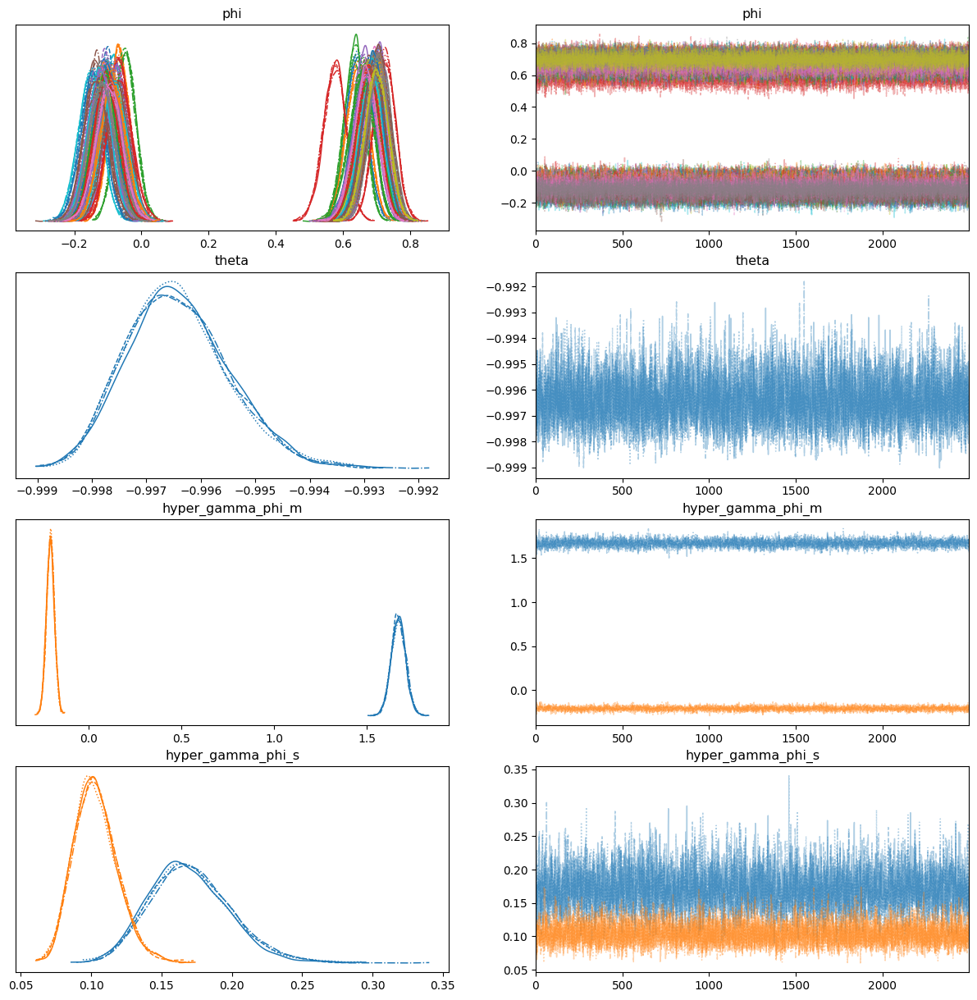

In [8]:
plt_aux = az.plot_trace(ritorno['inference_data'], var_names=['phi','theta','hyper_gamma_phi_m','hyper_gamma_phi_s'], divergences=True, figsize=(15,15))

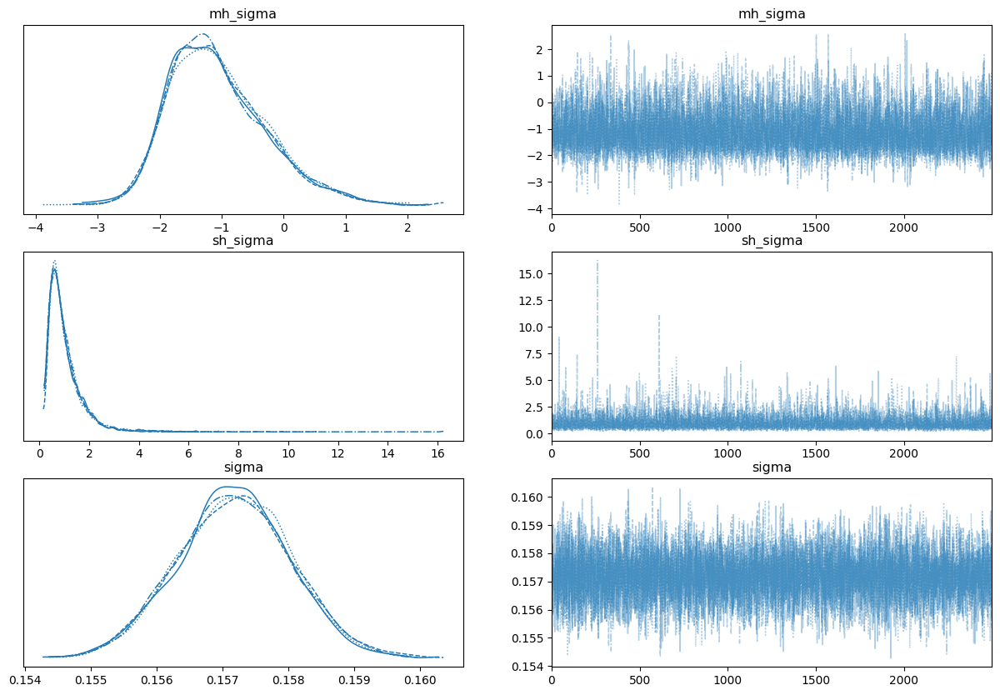

In [9]:
plt_aux = az.plot_trace(ritorno['inference_data'], var_names=['mh_sigma','sh_sigma','sigma'], divergences=True, figsize=(15,10))

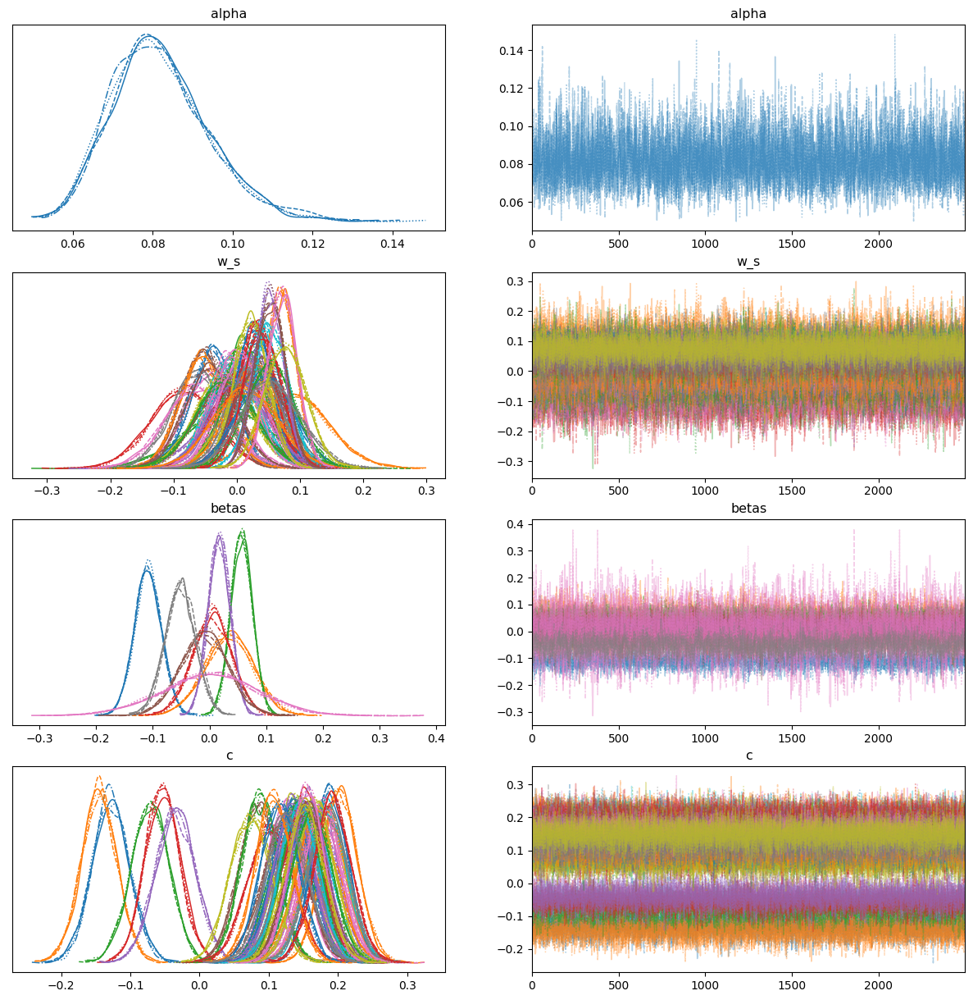

In [10]:
plt_aux = az.plot_trace(ritorno['inference_data'], var_names=['alpha','w_s','betas','c'], divergences=True, figsize=(15,15))

In [11]:
df_risultati = az.summary(ritorno['inference_data'], var_names=['betas'], hdi_prob=0.95)
df_risultati.loc[:,'Name'] = df_temp[1].columns
df_risultati.set_index('Name', inplace=True)
df_risultati

,mean,sd,hdi_2.5%,hdi_97.5%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
Name,,,,,,,,,
Altitude,-0.109,0.024,-0.157,-0.063,0.000,0.000,2824.0,4341.0,1.0
Type_Industrial,0.034,0.043,-0.050,0.120,0.001,0.001,3653.0,5676.0,1.0
Type_Traffic,0.057,0.019,0.019,0.095,0.000,0.000,3969.0,5911.0,1.0
Type_Rural,0.005,0.035,-0.060,0.076,0.001,0.000,2960.0,4837.0,1.0
Type_SubUrban,0.017,0.020,-0.021,0.055,0.000,0.000,4280.0,6165.0,1.0
Zone_Agglomerato,-0.009,0.042,-0.091,0.076,0.001,0.001,2587.0,4002.0,1.0
Zone_Appennino,0.000,0.085,-0.169,0.164,0.002,0.001,3074.0,4660.0,1.0
Zone_Est,-0.052,0.027,-0.103,0.002,0.001,0.000,1677.0,3271.0,1.0


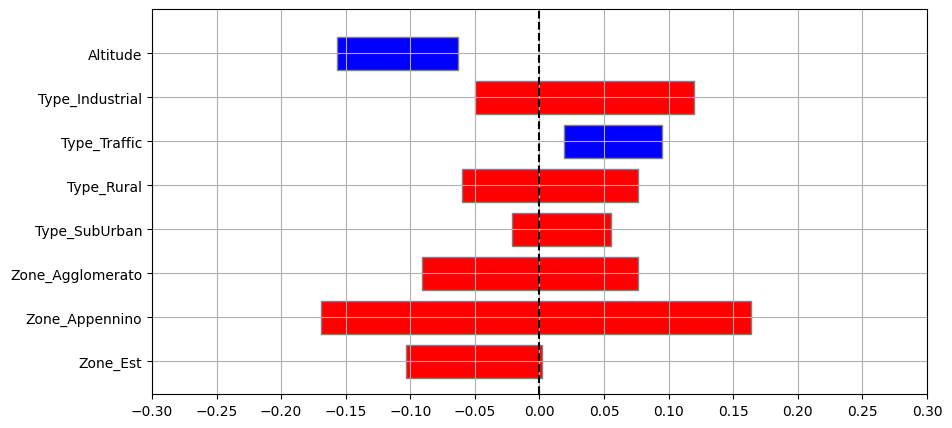

In [12]:
import time
from matplotlib.patches import Rectangle

plt.figure(figsize=(10,5))
ax = plt.subplot(1,1,1)
plt.xlim(left = -0.3, right = 0.3)
pos_rows = np.arange(0,len(df_risultati.index))
plt.ylim(bottom=-0.75, top=pos_rows[-1]+1.0)
i = 1
for row in df_risultati.index:    
    lci = df_risultati.loc[row, 'hdi_2.5%']
    rci = df_risultati.loc[row, 'hdi_97.5%']
    len_ci = rci - lci
    if lci*rci <= 0:
        col = 'red'
    else:
        col = 'blue'
    ax.add_patch(Rectangle((lci, pos_rows[-i] - 0.75/2), len_ci, 0.75,
             edgecolor = 'grey',
             facecolor = col,
             fill=True,
             lw=1))
    i += 1
    
    
plt.axvline(0, 0, pos_rows[-1]+0.75, linestyle='--', color='black')
plt.grid(axis='both')
plt.yticks(ticks=np.flip(pos_rows), labels=df_risultati.index.to_list())
plt.xticks(ticks=np.linspace(-0.3,0.3,13))
plt.show()

<AxesSubplot: ylabel='Density'>

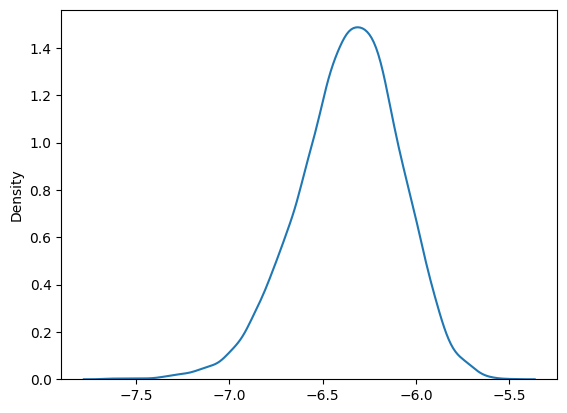

In [13]:
aux_shape = ritorno['inference_data'].posterior.gamma_th.values.shape
sns.kdeplot(ritorno['inference_data'].posterior.gamma_th.values.reshape((aux_shape[0]*aux_shape[1])), legend=False)

<AxesSubplot: ylabel='Density'>

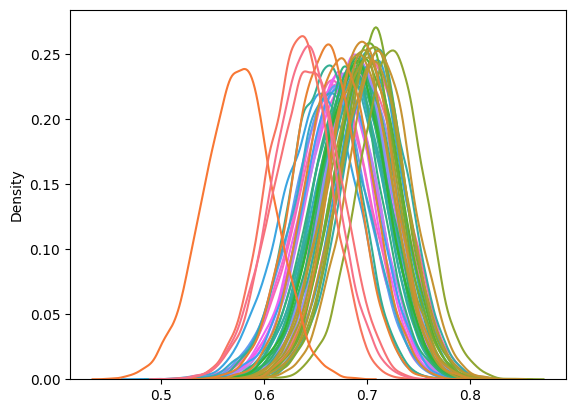

In [14]:
aux_shape = ritorno['inference_data'].posterior.phi.values.shape
sns.kdeplot(ritorno['inference_data'].posterior.phi.values.reshape((aux_shape[0]*aux_shape[1],aux_shape[2],aux_shape[3]))[:,0,:], legend=False)

<AxesSubplot: ylabel='Density'>

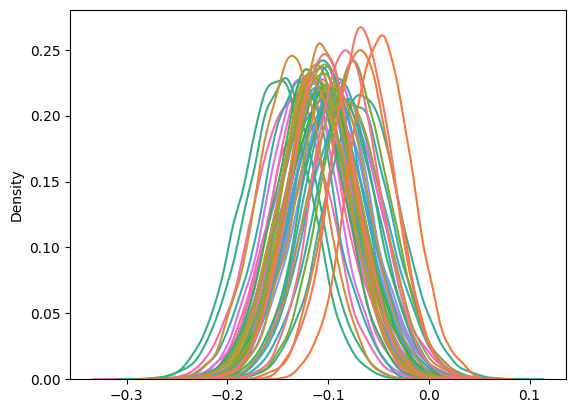

In [15]:
aux_shape = ritorno['inference_data'].posterior.phi.values.shape
sns.kdeplot(ritorno['inference_data'].posterior.phi.values.reshape((aux_shape[0]*aux_shape[1],aux_shape[2],aux_shape[3]))[:,1,:], legend=False)

<AxesSubplot: ylabel='Density'>

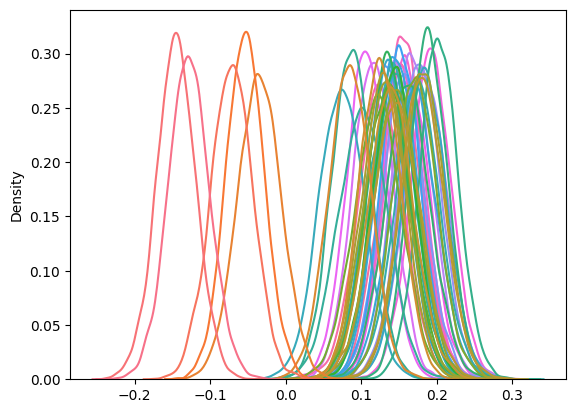

In [16]:
aux_shape = ritorno['inference_data'].posterior.c.values.shape
sns.kdeplot(ritorno['inference_data'].posterior.c.values.reshape((aux_shape[0]*aux_shape[1],aux_shape[2])), legend=False)

<AxesSubplot: ylabel='Density'>

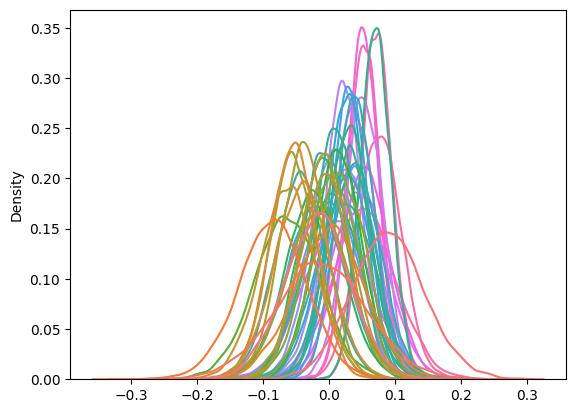

In [17]:
aux_shape = ritorno['inference_data'].posterior.w_s.values.shape
sns.kdeplot(ritorno['inference_data'].posterior.w_s.values.reshape((aux_shape[0]*aux_shape[1],aux_shape[2])), legend=False)

In [18]:
pd.set_option('display.max_columns', 500)
spatial_results = pd.DataFrame(ritorno['inference_data'].posterior.w_s.values.reshape((aux_shape[0]*aux_shape[1],aux_shape[2])), columns=df.columns).describe()
spatial_results.loc['abs_dist_from_mean',:] = (spatial_results.loc['mean',:] - spatial_results.loc['mean',:].mean()).abs()
spatial_results.sort_values('abs_dist_from_mean', axis=1, ascending=False)
#spatial_results.sort_values('mean', axis=1, ascending=True)

,SAVIGNANO DI RIGO,FEBBIO,SAN LAZZARO,GIARDINI MARGHERITA,TIMAVO,VERUCCHIO,DE AMICIS,SAN FRANCESCO,PARCO EDILCARANI,PORTA SAN FELICE,BADIA,MARECCHIA,GERBIDO,S. LAZZARO,FLAMINIA,CITTADELLA,MONTEBELLO,S. ROCCO,GAVELLO,GIARDINI,VILLA FULVIA,PARCO FERRARI,BOGOLESE,CASTELLUCCIO,VIA CHIARINI,SAN PIETRO CAPOFIUME,CENO,CORTE BRUGNATELLA,CAORLE,SARAGAT,CASTELLARANO,ROMA,PARCO RESISTENZA,ISONZO,PARCO MONTECUCCO,ZALAMELLA,CENTO,GHERARDI,PARCO BERTOZZI,GIORDANI-FARNESE,SAN LEO,FRANCHINI-ANGELONI,PARADIGNA,BESENZONE,SAVIGNANO,REMESINA,LUGAGNANO,MALCANTONE,DELTA CERVIA
count,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000
mean,-0.085256,0.090438,-0.062758,-0.061179,0.076898,-0.053923,-0.052873,0.071998,0.070562,-0.041013,-0.040519,-0.038737,0.054784,0.053523,0.053274,0.052707,0.050866,0.045335,-0.021751,0.040508,0.040244,0.039730,-0.017955,-0.017825,-0.016629,-0.016504,0.035443,-0.012049,0.032690,0.031248,0.030368,-0.008426,-0.006673,0.027101,0.027051,-0.005933,0.026307,0.025133,-0.004131,0.022656,0.001161,0.018290,0.003424,0.005366,0.005968,0.007031,0.013551,0.013139,0.011090
std,0.051762,0.055739,0.049765,0.042939,0.033002,0.034507,0.037416,0.023190,0.023108,0.040829,0.042277,0.034955,0.048296,0.029146,0.039477,0.023562,0.022951,0.043360,0.044059,0.029765,0.037940,0.028551,0.047166,0.050742,0.048690,0.046231,0.039652,0.070760,0.036443,0.028046,0.032298,0.037453,0.036953,0.038356,0.028451,0.035537,0.040778,0.045294,0.039785,0.027519,0.054816,0.039529,0.046281,0.044585,0.040233,0.035686,0.035428,0.051514,0.032409
min,-0.309093,-0.135869,-0.253992,-0.221576,-0.042387,-0.189186,-0.187342,-0.025468,-0.021174,-0.192243,-0.215443,-0.189844,-0.134987,-0.067991,-0.094413,-0.037197,-0.035863,-0.121586,-0.178745,-0.073786,-0.103088,-0.063503,-0.196239,-0.218721,-0.191980,-0.199127,-0.117411,-0.324665,-0.129863,-0.083385,-0.102233,-0.156523,-0.160536,-0.113564,-0.090765,-0.149914,-0.114222,-0.172926,-0.149918,-0.088844,-0.266741,-0.151628,-0.181537,-0.158826,-0.171157,-0.141326,-0.127480,-0.230634,-0.114607
25%,-0.119403,0.053220,-0.096185,-0.089413,0.054831,-0.077194,-0.077647,0.056553,0.054947,-0.068006,-0.068975,-0.062057,0.022907,0.034590,0.027280,0.036487,0.035271,0.016050,-0.051094,0.020624,0.014793,0.020512,-0.049480,-0.051669,-0.048952,-0.046874,0.008916,-0.058026,0.008447,0.012758,0.008886,-0.033314,-0.031388,0.001434,0.008256,-0.029419,-0.000646,-0.005079,-0.030394,0.004174,-0.035007,-0.008409,-0.027614,-0.024037,-0.020613,-0.016780,-0.009960,-0.021241,-0.010387
50%,-0.084646,0.090060,-0.063155,-0.061281,0.076965,-0.053597,-0.053857,0.072025,0.070457,-0.041920,-0.039870,-0.038581,0.053786,0.053200,0.053426,0.052847,0.050907,0.045476,-0.022111,0.039874,0.040155,0.039523,-0.018115,-0.016908,-0.016550,-0.016663,0.035715,-0.012643,0.032620,0.031273,0.030545,-0.008668,-0.007165,0.027031,0.027409,-0.006039,0.026891,0.024891,-0.003780,0.022482,0.002032,0.017774,0.002775,0.005101,0.005946,0.006835,0.013815,0.013437,0.010992
75%,-0.050487,0.127243,-0.029049,-0.032911,0.098891,-0.030684,-0.028119,0.087371,0.086013,-0.014506,-0.012262,-0.015286,0.085848,0.073183,0.079130,0.068753,0.066533,0.073896,0.007522,0.060310,0.065790,0.059056,0.013192,0.015319,0.015587,0.014069,0.061773,0.034642,0.057308,0.049997,0.051642,0.016310,0.017691,0.052828,0.045996,0.017505,0.053041,0.055647,0.022526,0.040723,0.037446,0.044922,0.034028,0.035143,0.032989,0.030902,0.037425,0.047316,0.032539
ma

<AxesSubplot: ylabel='Density'>

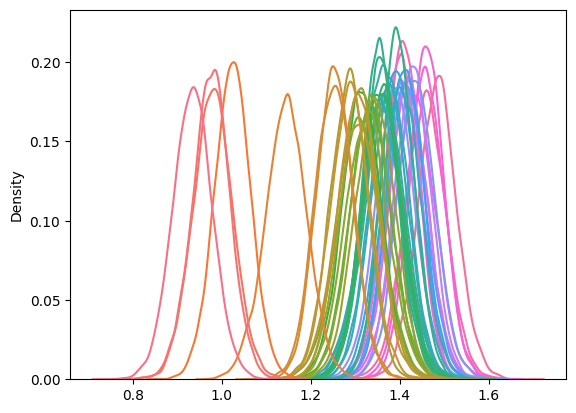

In [19]:
aux_shape = ritorno['inference_data'].posterior.annual_mean.values.shape
sns.kdeplot(ritorno['inference_data'].posterior.annual_mean.values.reshape((aux_shape[0]*aux_shape[1],aux_shape[2])), legend=False)

<AxesSubplot: ylabel='Density'>

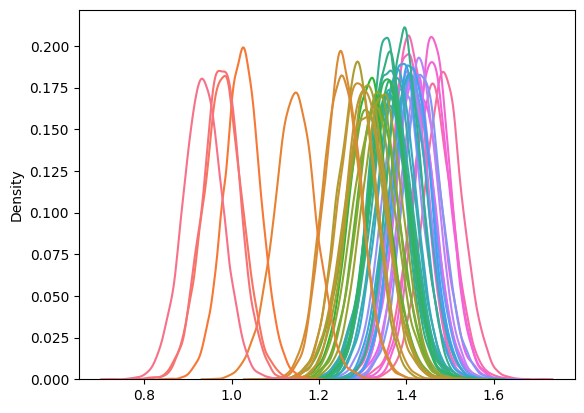

In [20]:
aux_shape = ritorno['inference_data'].posterior.annual_median.values.shape
sns.kdeplot(ritorno['inference_data'].posterior.annual_median.values.reshape((aux_shape[0]*aux_shape[1],aux_shape[2])), legend=False)

<AxesSubplot: ylabel='Density'>

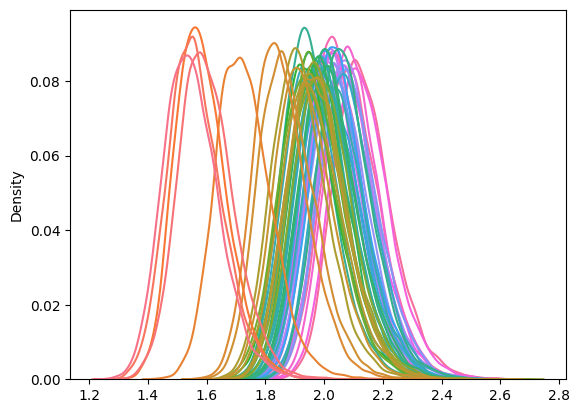

In [21]:
aux_shape = ritorno['inference_data'].posterior.annual_max.values.shape
sns.kdeplot(ritorno['inference_data'].posterior.annual_max.values.reshape((aux_shape[0]*aux_shape[1],aux_shape[2])), legend=False)

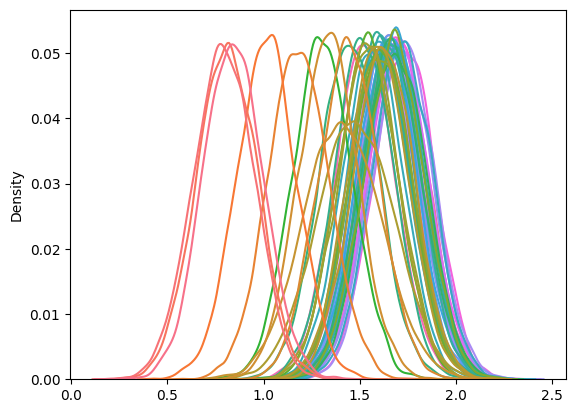

In [22]:
valori_31_dic = []
for dizionario in ritorno['missing']:
    if dizionario['Data'] == '2018-12-31':
        valori_31_dic.append(dizionario['Samples'])
        
res_plot = sns.kdeplot(valori_31_dic, legend=False)

<AxesSubplot: ylabel='Density'>

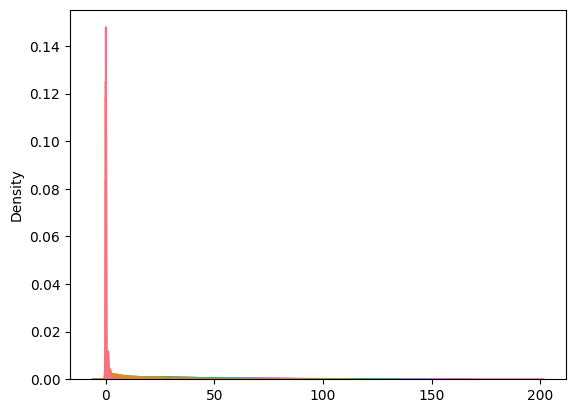

In [23]:
aux_shape = ritorno['inference_data'].posterior.annual_days_over_threshold.values.shape
sns.kdeplot(ritorno['inference_data'].posterior.annual_days_over_threshold.values.reshape((aux_shape[0]*aux_shape[1],aux_shape[2])), legend=False)

In [24]:
pd.set_option('display.max_columns', 500)
aux_results = pd.DataFrame(ritorno['inference_data'].posterior.annual_days_over_threshold.values.reshape((aux_shape[0]*aux_shape[1],aux_shape[2])), columns=df.columns).describe()
aux_results.sort_values('mean', axis=1, ascending=True)

,CASTELLUCCIO,CORTE BRUGNATELLA,SAVIGNANO DI RIGO,FEBBIO,SAN LEO,VERUCCHIO,BADIA,MARECCHIA,GIARDINI MARGHERITA,SAN PIETRO CAPOFIUME,LUGAGNANO,PARCO BERTOZZI,DELTA CERVIA,PARCO RESISTENZA,DE AMICIS,GHERARDI,SAN LAZZARO,FRANCHINI-ANGELONI,VIA CHIARINI,BESENZONE,GAVELLO,SAVIGNANO,CAORLE,PORTA SAN FELICE,VILLA FULVIA,PARCO MONTECUCCO,CASTELLARANO,ROMA,CENTO,BOGOLESE,ZALAMELLA,MALCANTONE,S. LAZZARO,SAN FRANCESCO,S. ROCCO,CITTADELLA,REMESINA,PARADIGNA,SARAGAT,PARCO EDILCARANI,PARCO FERRARI,ISONZO,GIORDANI-FARNESE,FLAMINIA,CENO,GERBIDO,MONTEBELLO,GIARDINI,TIMAVO
count,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.00000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.00000,10000.000000,10000.000000,10000.000000,10000.00000,10000.00000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.00000,10000.00000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000
mean,0.079200,0.099200,0.120000,0.194200,1.398200,6.631200,8.290600,12.368900,14.114200,16.876800,17.462300,17.986600,18.407600,19.957500,20.599600,20.773700,20.83930,21.235700,22.824100,24.003100,24.516700,24.520100,25.722900,26.417800,27.040900,28.467500,29.25990,29.280500,30.479100,32.877700,33.37780,36.01070,37.437000,37.448500,37.503500,37.523700,37.595600,37.89760,39.28930,41.232000,42.321300,43.172900,47.321100,48.425500,49.438700,53.588700,55.750100,60.511900,66.443100
std,0.321151,0.367387,0.386024,0.522603,1.836402,4.707972,5.507412,6.993848,7.885999,9.869993,9.257988,10.143555,8.938873,9.866794,10.115578,11.104072,10.68403,11.078051,11.198272,12.023591,11.510881,11.441708,12.266498,11.355384,12.139562,12.605024,11.63496,12.934858,13.595722,13.294421,13.63159,14.66728,14.503726,13.027944,14.430648,13.326762,14.564116,14.99654,14.29132,13.525334,15.185438,15.451009,16.022736,17.191917,16.964829,18.713069,16.823363,17.912815,20.057577
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.00000,1.000000,1.000000,2.000000,1.00000,2.00000,3.000000,5.000000,2.000000,4.000000,2.000000,1.00000,3.00000,6.000000,4.000000,4.000000,5.000000,6.000000,5.000000,6.000000,5.000000,7.000000,13.000000
25%,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000,4.000000,7.000000,8.000000,10.000000,11.000000,11.000000,12.000000,13.000000,13.000000,13.000000,13.00000,13.000000,15.000000,15.000000,16.000000,16.000000,17.000000,18.000000,18.000000,19.000000,21.00000,20.000000,21.000000,23.000000,24.00000,25.00000,27.000000,28.000000,27.000000,28.000000,27.000000,27.00000,29.00000,32.000000,32.000000,32.000000,36.000000,36.000000,37.000000,40.000000,44.000000,48.000000,52.000000
50%,0.000000,0.000000,0.000000,0.000000,1.000000,6.000000,7.000000,11.000000,13.000000,15.000000,16.000000,16.000000,17.000000,19.000000,19.000000,19.000000,19.00000,20.000000,21.000000,22.000000,23.000000,23.000000,24.000000,25.000000,25.000000,27.000000,28.00000,27.000000,29.000000,31.000000,32.00000,34.00000,36.000000,36.000000,36.000000,36.000000,36.000000,36.00000,38.00000,40.000000,41.000000,42.000000,46.000000,47.000000,48.000000,52.000000,55.000000,59.000000,65.000000
75%,0.000000,0.000000,0.000000,0.000000,2.000000,9.000000,11.000000,16.000000,18.000000,22.000000,22.000000,23.000000,23.000000,25.000000,26.000000,27.000000,27.00000,27.000000,29.000000,31.000000,31.000000,31.000000,32.000000,33.000000,34.000000,36.000000,36.00000,36.000000,38.000000,41.000000,41.00000,44.00000,46.000000,45.000000,46.000000,46.000000,46.000000,47.00000,48.00000,50.000000,52.000000,52.000000,57.000000,59.000000,60.000000,65

In [25]:
pd.set_option('display.max_columns', 500)
aux_results = pd.DataFrame(ritorno['inference_data'].posterior.is_over_daily_limit.values.reshape((aux_shape[0]*aux_shape[1],aux_shape[2])), columns=df.columns).describe()
aux_results.sort_values('mean', axis=1, ascending=True)

,CASTELLUCCIO,FEBBIO,CORTE BRUGNATELLA,SAVIGNANO DI RIGO,SAN LEO,VERUCCHIO,BADIA,MARECCHIA,GIARDINI MARGHERITA,LUGAGNANO,DELTA CERVIA,SAN PIETRO CAPOFIUME,PARCO BERTOZZI,PARCO RESISTENZA,DE AMICIS,SAN LAZZARO,GHERARDI,FRANCHINI-ANGELONI,VIA CHIARINI,BESENZONE,SAVIGNANO,GAVELLO,CAORLE,PORTA SAN FELICE,VILLA FULVIA,PARCO MONTECUCCO,CASTELLARANO,ROMA,CENTO,BOGOLESE,ZALAMELLA,MALCANTONE,S. LAZZARO,REMESINA,S. ROCCO,PARADIGNA,SAN FRANCESCO,CITTADELLA,SARAGAT,PARCO EDILCARANI,PARCO FERRARI,ISONZO,GIORDANI-FARNESE,FLAMINIA,CENO,GERBIDO,MONTEBELLO,GIARDINI,TIMAVO
count,10000.0,10000.0,10000.0,10000.0,10000.0,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.00000,10000.000000,10000.000000,10000.000000,10000.00000,10000.000000,10000.00000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.00000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.00000,10000.000000,10000.000000,10000.00000,10000.00000,10000.000000,10000.000000,10000.000000,10000.000000
mean,0.0,0.0,0.0,0.0,0.0,0.000600,0.000900,0.006500,0.014600,0.043700,0.046800,0.049900,0.060100,0.071300,0.081200,0.09130,0.095600,0.103400,0.126300,0.16060,0.160700,0.16150,0.187300,0.191400,0.217300,0.256700,0.262800,0.271600,0.309200,0.373200,0.392100,0.467000,0.510500,0.51070,0.513100,0.517100,0.522200,0.525600,0.566600,0.641900,0.64950,0.670000,0.757900,0.76680,0.78890,0.839000,0.893700,0.932200,0.956900
std,0.0,0.0,0.0,0.0,0.0,0.024489,0.029988,0.080364,0.119951,0.204437,0.211221,0.217749,0.237684,0.257338,0.273156,0.28805,0.294057,0.304496,0.332204,0.36718,0.367272,0.36801,0.390172,0.393423,0.412429,0.436834,0.440177,0.444807,0.462187,0.483679,0.488243,0.498935,0.499915,0.49991,0.499853,0.499732,0.499532,0.499369,0.495569,0.479466,0.47715,0.470236,0.428376,0.42289,0.40811,0.367549,0.308237,0.251415,0.203092
min,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.00000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.00000,0.00000,0.000000,0.000000,0.000000,0.000000
25%,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.00000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,1.000000,1.00000,1.00000,1.000000,1.000000,1.000000,1.000000
50%,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.00000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.00000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000,1.000000,1.00000,1.00000,1.000000,1.000000,1.000000,1.000000
75%,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.00000,0.000000,0.00000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000,1.000000,1.00000,1.00000,1.000000,1.000000,1.000000,1.000000
max,0.0,0.0,0.0,0.0,0.0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000,1.000000,1.000000,1.00000,1.000000,1.00000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000,1.000

<AxesSubplot: >

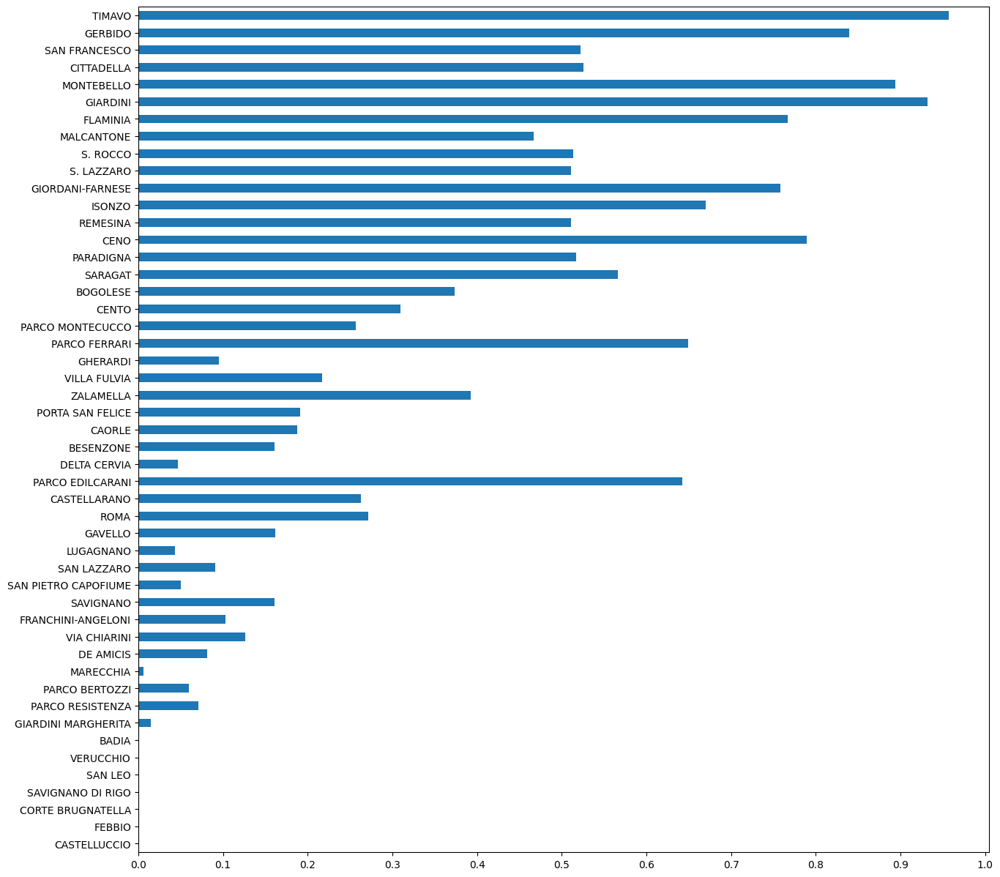

In [26]:
aux_results.loc['mean',:].plot(kind='barh', figsize=(15,15), xticks=np.linspace(0,1,11))
#res = plt.xticks(rotation = 30)

In [27]:
pd.set_option('display.max_columns', 500)
aux_results = pd.DataFrame(ritorno['inference_data'].posterior.is_over_annual_limit.values.reshape((aux_shape[0]*aux_shape[1],aux_shape[2])), columns=df.columns).describe()
aux_results.sort_values('mean', axis=1, ascending=True)

,CASTELLUCCIO,DELTA CERVIA,BESENZONE,PORTA SAN FELICE,ZALAMELLA,VILLA FULVIA,GHERARDI,PARCO FERRARI,PARCO EDILCARANI,PARCO MONTECUCCO,BOGOLESE,SARAGAT,REMESINA,S. LAZZARO,S. ROCCO,CITTADELLA,SAN FRANCESCO,CENTO,CASTELLARANO,CAORLE,GAVELLO,VERUCCHIO,CORTE BRUGNATELLA,ROMA,BADIA,GIARDINI MARGHERITA,PARCO RESISTENZA,PARCO BERTOZZI,SAVIGNANO DI RIGO,MARECCHIA,VIA CHIARINI,FRANCHINI-ANGELONI,SAVIGNANO,FEBBIO,SAN PIETRO CAPOFIUME,SAN LAZZARO,LUGAGNANO,DE AMICIS,SAN LEO,MALCANTONE,PARADIGNA,ISONZO,GIORDANI-FARNESE,FLAMINIA,MONTEBELLO,CENO,GIARDINI,GERBIDO,TIMAVO
count,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0,10000.0000,10000.0000,10000.0000,10000.0000,10000.000000,10000.000000,10000.000000,10000.000000,10000.00000,10000.000000
mean,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0001,0.0001,0.0001,0.0001,0.000200,0.000200,0.000300,0.000900,0.00180,0.005600
std,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0100,0.0100,0.0100,0.0100,0.014141,0.014141,0.017319,0.029988,0.04239,0.074627
min,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0000,0.0000,0.0000,0.0000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000
25%,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0000,0.0000,0.0000,0.0000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000
50%,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0000,0.0000,0.0000,0.0000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000
75%,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0000,0.0000,0.0000,0.0000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000
max,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0000,1.0000,1.0000,1.0000,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000


<AxesSubplot: >

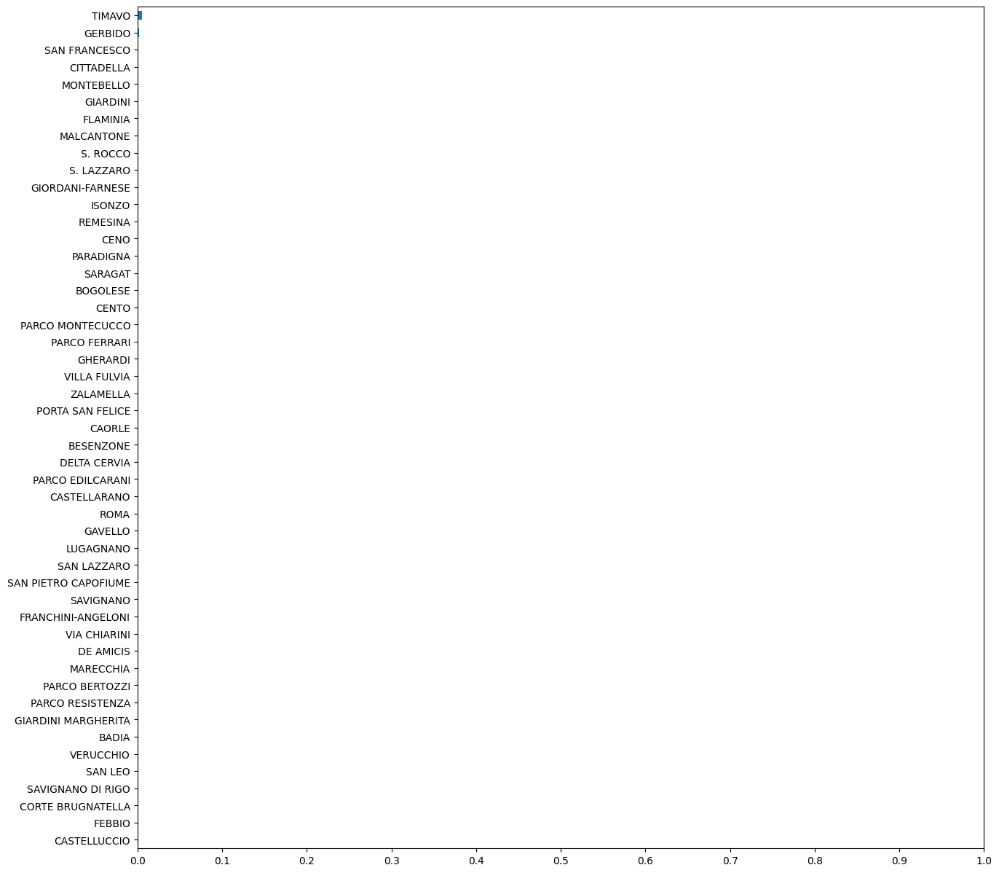

In [28]:
aux_results.loc['mean',:].plot(kind='barh', figsize=(15,15), xticks=np.linspace(0,1,11))
#res = plt.xticks(rotation = 30)

In [29]:
y_post_pred = ritorno['inference_data'].posterior.y_post_pred.to_numpy()
y_post_pred = y_post_pred.reshape(y_post_pred.shape[0]*y_post_pred.shape[1], y_post_pred.shape[2], y_post_pred.shape[3])
y_post_pred.shape

(10000, 365, 49)

In [30]:
import ipywidgets as widgets
from ipywidgets import HBox, VBox
from IPython.display import display

In [31]:
@widgets.interact(stazione = df.columns)
def f(stazione):
    col_map = sns.light_palette((20, 75, 70), input='husl', as_cmap=True)

    plt.figure(figsize=(14,8))
    ax = plt.subplot(1,1,1)

    idx_stazione = df.columns.to_list().index(stazione)
    
    """
    sns.lineplot(np.transpose(y_post_pred[0:50,:,idx_stazione]))
    """

    lower_lim = np.zeros(len(df.index))
    upper_lim = np.zeros(len(df.index))    
    for i in range(len(df.index)):
        lower_lim[i] = np.percentile(y_post_pred[:,i,idx_stazione],2.5)
        upper_lim[i] = np.percentile(y_post_pred[:,i,idx_stazione],97.5)
    
    
#    sns.lineplot(lower_lim)
#    sns.lineplot(upper_lim)
    
    for i in range(len(df.index)):
        ax.add_patch(mplt.patches.Rectangle((i,lower_lim[i]),1,upper_lim[i]-lower_lim[i], fill=True, color=col_map(180)))

    sns.lineplot(df[stazione])    
    sns.lineplot(np.mean(y_post_pred[:,:,idx_stazione], axis=0))


    index = 0
    for line in ax.get_lines():
        if index == 0:
            col_map = sns.dark_palette((230,90,65), input='husl', as_cmap=True)
            line.set_c(col_map(155))
        else:
            col_map = sns.dark_palette((10,90,65), input='husl', as_cmap=True)
            line.set_c(col_map(175))
        index += 1
        
    plt.ylim(bottom=0,top=2.5)

    primo_giorno = datetime.date(2018,1,1)
    date_da_segnare = []
    date_da_segnare_posizioni = []

    for i in range(12):
        date_da_segnare.append(datetime.date(2018,i+1,1))
        date_da_segnare_posizioni.append((date_da_segnare[2*i] - primo_giorno).days)
        date_da_segnare.append(datetime.date(2018,i+1,15))
        date_da_segnare_posizioni.append((date_da_segnare[2*i+1] - primo_giorno).days)
        date_da_segnare[2*i] = date_da_segnare[2*i].isoformat()
        date_da_segnare[2*i+1] = date_da_segnare[2*i+1].isoformat()

    plt.xticks(date_da_segnare_posizioni,date_da_segnare,rotation=65)
    plt.tick_params(
        axis='x',          # changes apply to the x-axis
        which='both',      # both major and minor ticks are affected
        bottom=True,      # ticks along the bottom edge are off
        top=False,         # ticks along the top edge are off
        labelbottom=True)
    plt.grid()
    
    """
    ax.get_legend().remove()
    col_vals = np.linspace(1,255,num=len(df.columns))
    index = 0
    for line in ax.get_lines():
        if(index == len(ax.get_lines()) - 1):
            col_map = sns.dark_palette((230,90,65), input='husl', as_cmap=True)
            line.set_c(col_map(175))
            continue
        if(index == len(ax.get_lines()) - 2):
            col_map = sns.dark_palette((120,90,65), input='husl', as_cmap=True)
            line.set_c(col_map(175))
            index += 1
            continue

        #line.set_c(col_map(int(np.round(col_vals[index]))))
        line.set_c(col_map(220))
        line.set_alpha(0.3)
        index += 1
    """
    
    

    plt.show()

interactive(children=(Dropdown(description='stazione', options=('CASTELLUCCIO', 'FEBBIO', 'CORTE BRUGNATELLA',…

In [32]:
def f(stazione):
    col_map = sns.light_palette((20, 75, 70), input='husl', as_cmap=True)

    plt.figure(figsize=(14,8))
    ax = plt.subplot(1,1,1)

    idx_stazione = df.columns.to_list().index(stazione)
    
    """
    sns.lineplot(np.transpose(y_post_pred[0:50,:,idx_stazione]))
    """

    lower_lim = np.zeros(len(df.index))
    upper_lim = np.zeros(len(df.index))    
    for i in range(len(df.index)):
        lower_lim[i] = np.percentile(y_post_pred[:,i,idx_stazione],2.5)
        upper_lim[i] = np.percentile(y_post_pred[:,i,idx_stazione],97.5)
    
    
#    sns.lineplot(lower_lim)
#    sns.lineplot(upper_lim)
    
    for i in range(len(df.index)):
        ax.add_patch(mplt.patches.Rectangle((i,lower_lim[i]),1,upper_lim[i]-lower_lim[i], fill=True, color=col_map(180)))

    sns.lineplot(df[stazione])    
    sns.lineplot(np.mean(y_post_pred[:,:,idx_stazione], axis=0))


    index = 0
    for line in ax.get_lines():
        if index == 0:
            col_map = sns.dark_palette((230,90,65), input='husl', as_cmap=True)
            line.set_c(col_map(155))
        else:
            col_map = sns.dark_palette((10,90,65), input='husl', as_cmap=True)
            line.set_c(col_map(175))
        index += 1
        
    plt.ylim(bottom=0,top=2.5)

    primo_giorno = datetime.date(2018,1,1)
    date_da_segnare = []
    date_da_segnare_posizioni = []

    for i in range(12):
        date_da_segnare.append(datetime.date(2018,i+1,1))
        date_da_segnare_posizioni.append((date_da_segnare[2*i] - primo_giorno).days)
        date_da_segnare.append(datetime.date(2018,i+1,15))
        date_da_segnare_posizioni.append((date_da_segnare[2*i+1] - primo_giorno).days)
        date_da_segnare[2*i] = date_da_segnare[2*i].isoformat()
        date_da_segnare[2*i+1] = date_da_segnare[2*i+1].isoformat()

    plt.xticks(date_da_segnare_posizioni,date_da_segnare,rotation=65)
    plt.tick_params(
        axis='x',          # changes apply to the x-axis
        which='both',      # both major and minor ticks are affected
        bottom=True,      # ticks along the bottom edge are off
        top=False,         # ticks along the top edge are off
        labelbottom=True)
    plt.grid()
    
    """
    ax.get_legend().remove()
    col_vals = np.linspace(1,255,num=len(df.columns))
    index = 0
    for line in ax.get_lines():
        if(index == len(ax.get_lines()) - 1):
            col_map = sns.dark_palette((230,90,65), input='husl', as_cmap=True)
            line.set_c(col_map(175))
            continue
        if(index == len(ax.get_lines()) - 2):
            col_map = sns.dark_palette((120,90,65), input='husl', as_cmap=True)
            line.set_c(col_map(175))
            index += 1
            continue

        #line.set_c(col_map(int(np.round(col_vals[index]))))
        line.set_c(col_map(220))
        line.set_alpha(0.3)
        index += 1
    """
    
    

    plt.show()

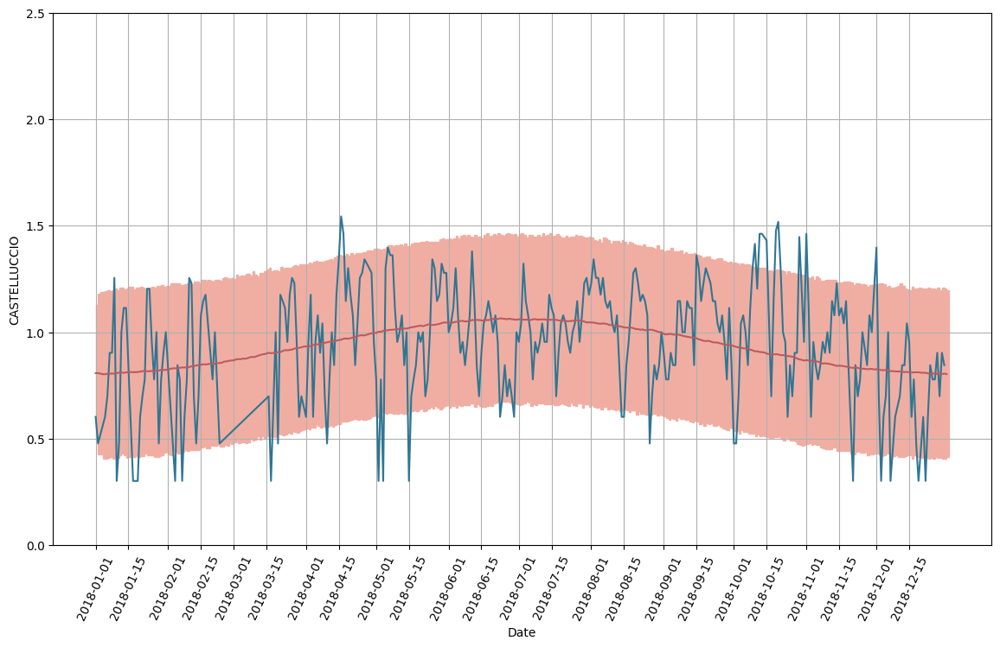

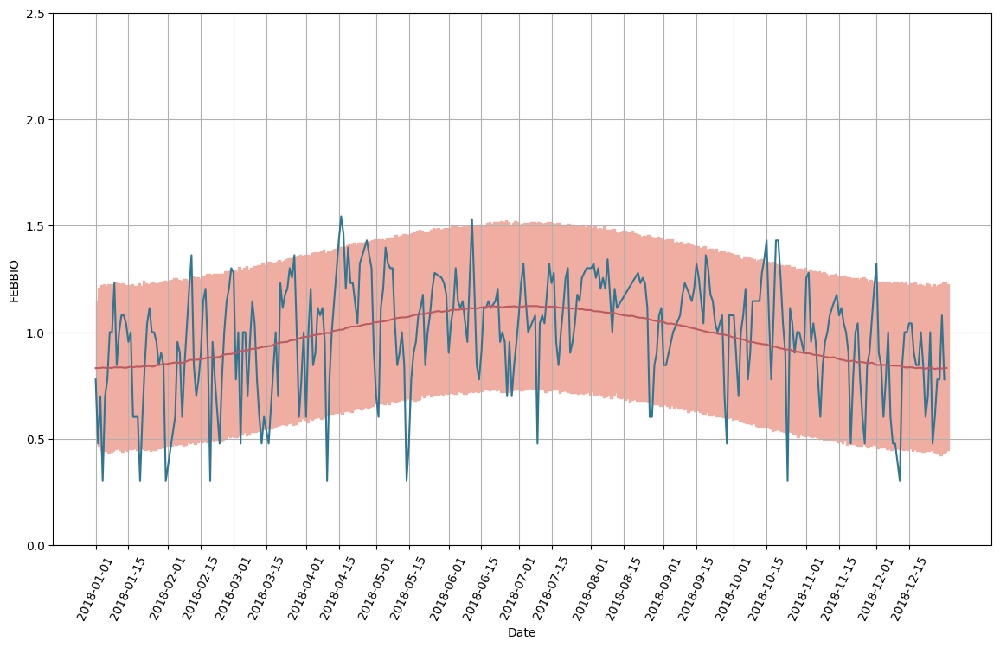

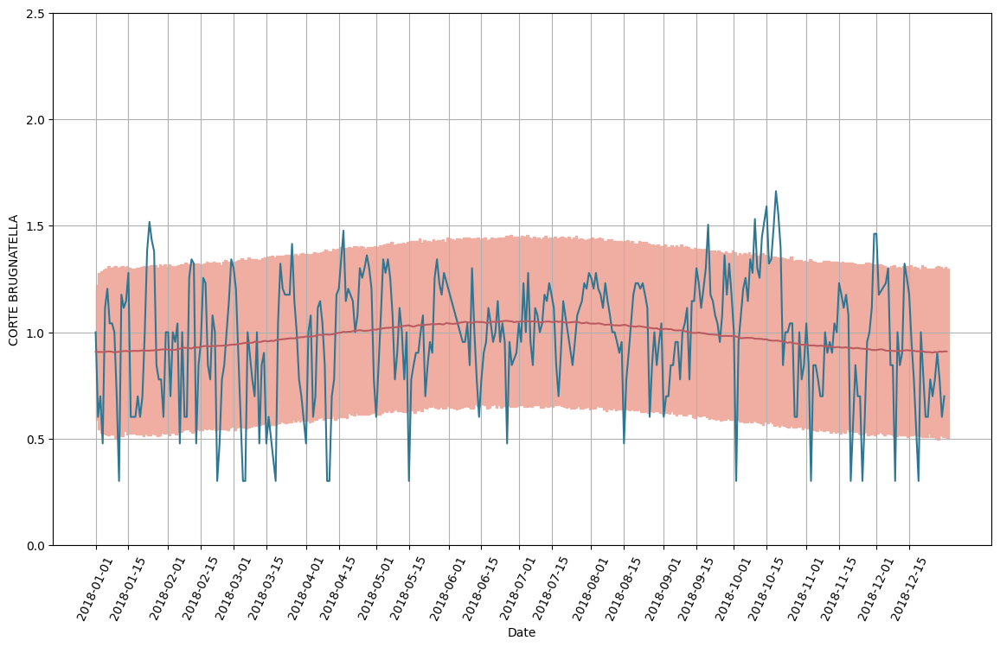

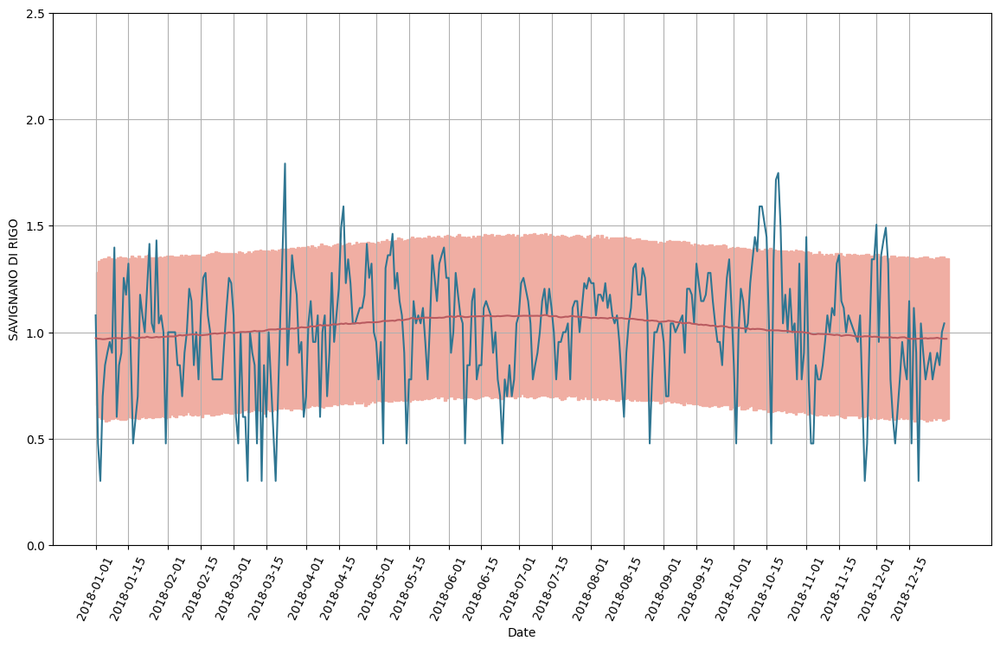

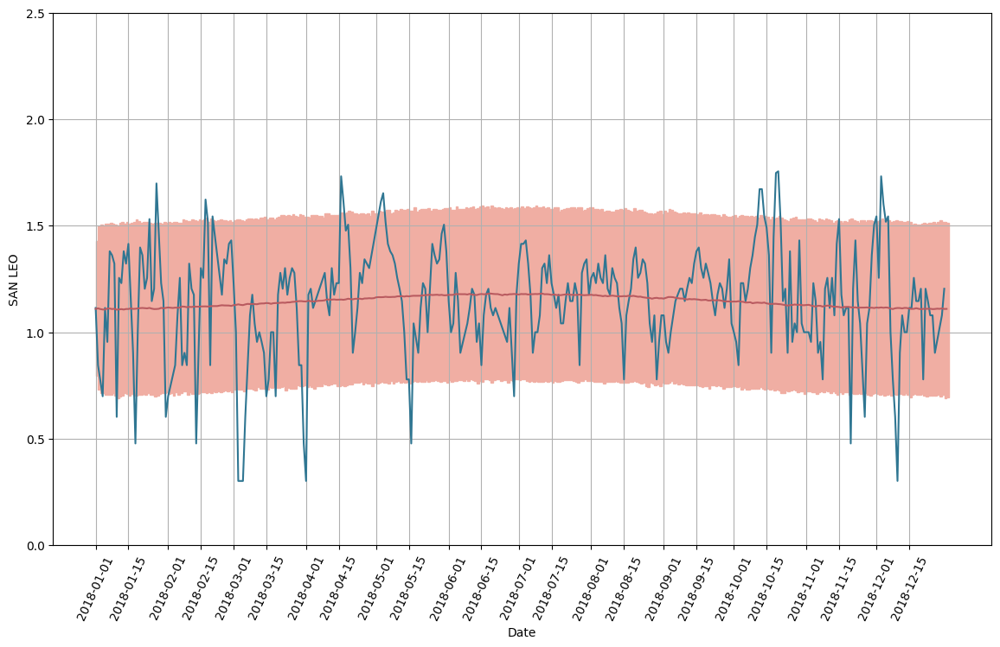

...

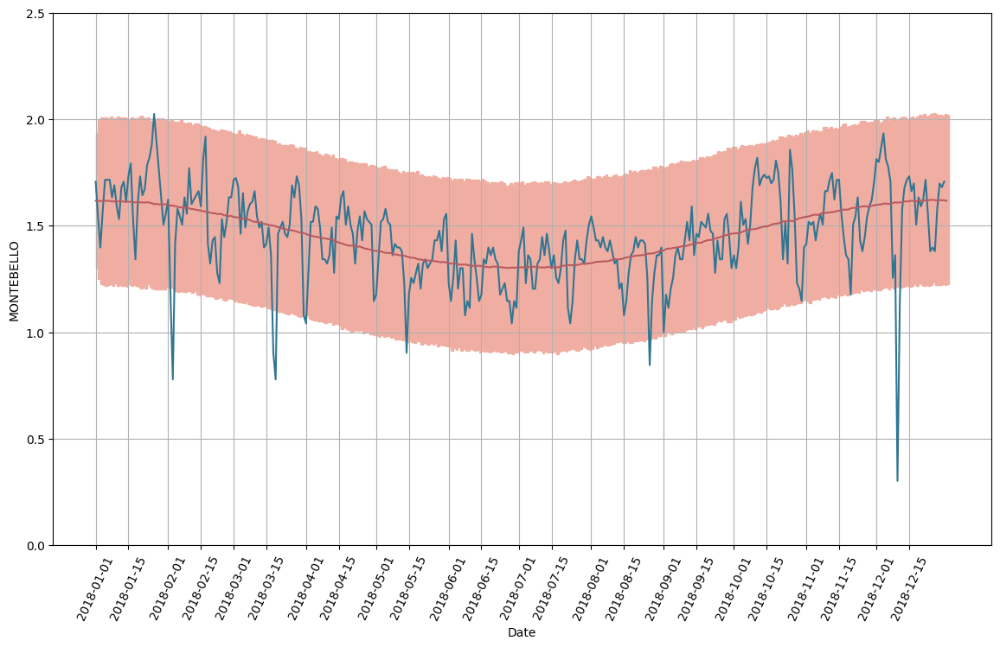

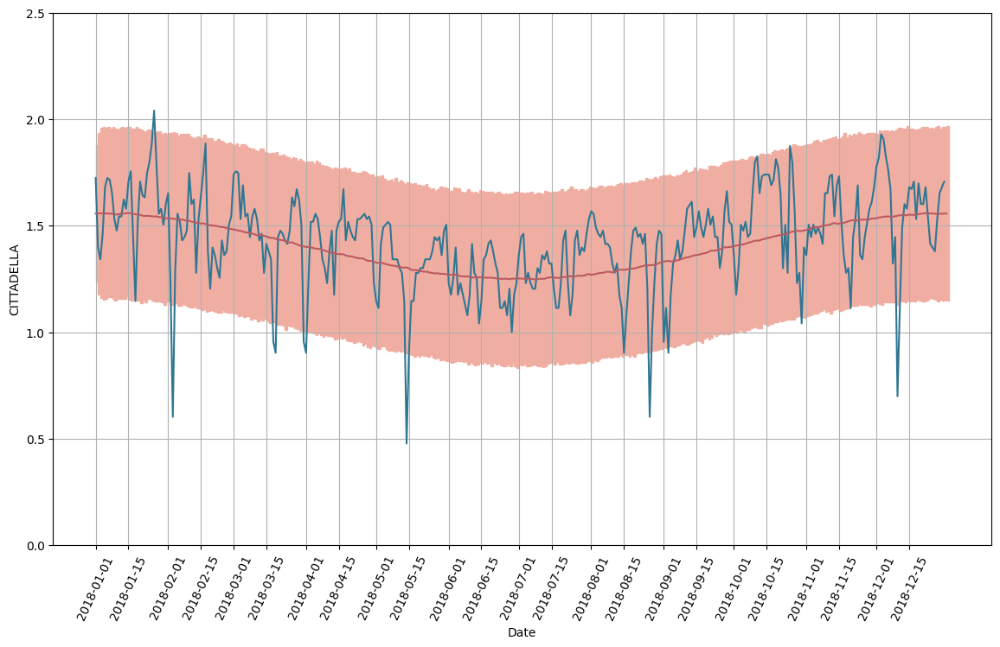

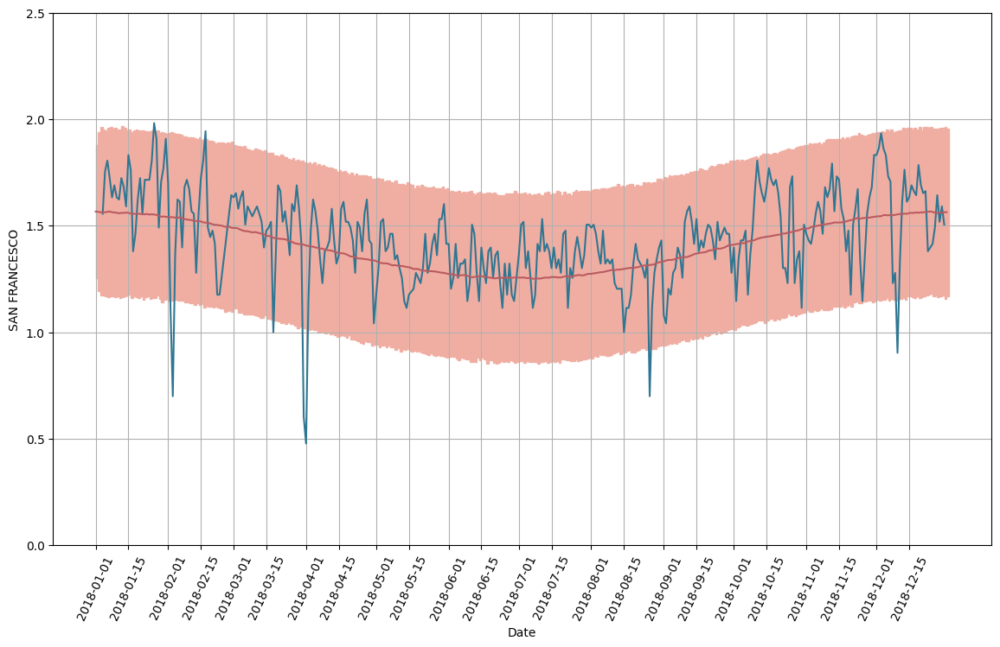

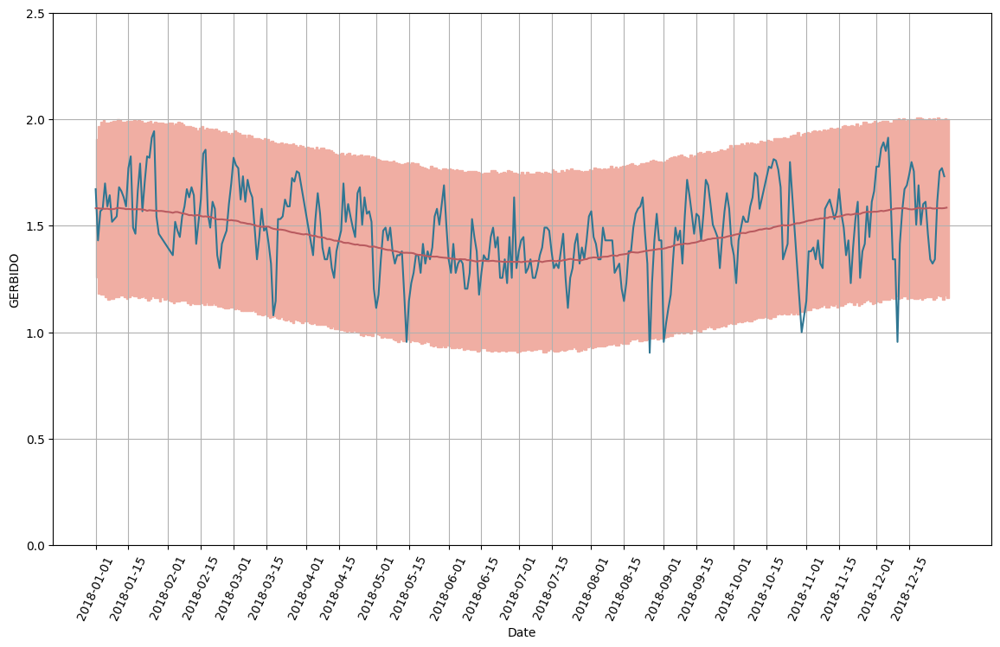

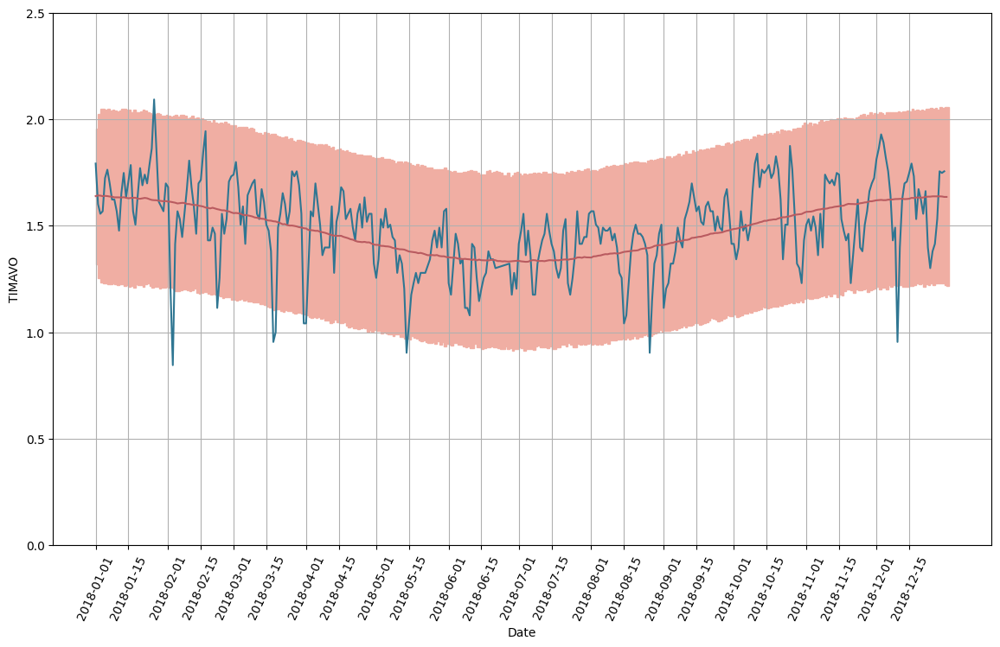

In [33]:
for stazione in df.columns:
    f(stazione)